##  Project Name: Tennis Sport Victory Prediction



## Tennis Sport Victory Prediction

* Data Source : Kaggle
* Importing the required packages
* Upload the csv, log, file to Databricks
* Reading the data file and performing basic Exploratory Data Analysis
* Checked the column Correlation and remove the highly correlated features as to reduce the complexity of the algorithm, thus decreasing the risk of errors.
* Targeting a subset of columns for classification
* Summarizing the data to get overall idea
* Data Cleaning by filtering out null values
* Data Visualization for data analysis
* Dividing the data into train and test ration of 60-40
* To streamline the data, establishing the pipeine, and stablising one with Logistic Regression
* We need a set of optimal hyperparameter values for the learning algorithm while applying this optimized algorithm to any data set, we are using Paramgrid and CrossValidator for Hyperparameter Tuning, comparing and selecting the right model for the dataset
* We need a measure of how well a machine learning model generalizes to similar data so that on which it was trained,to provide more accurate outcomes. So we fit the model with the training data
* Apply the Classification model on the test data to test the model
* Evaluating the model

## Objective
The goal of this project is to analyze data from tennis competitions in order to predict the results of tennis matches.

# Data Collection
Dataset is taken from Kaggle https://www.kaggle.com/code/ahlemj/predict-atp-tennis/data

In [ ]:
%sh
python --version

Python 3.8.10


Install the required packages

In [ ]:
%sh
pip install kaggle
pip install mlflow

You should consider upgrading via the '/databricks/python3/bin/python -m pip install --upgrade pip' command.
You should consider upgrading via the '/databricks/python3/bin/python -m pip install --upgrade pip' command.


In [ ]:
import pyspark
import pandas as pd
from pyspark.sql.functions import col, desc, udf, sum as Fsum, from_unixtime, \
    count, countDistinct, when, isnull, max as Fmax, min as Fmin, length, \
    month, datediff, first, year, concat
from pyspark.sql.types import IntegerType, FloatType, DateType, TimestampType, LongType, StringType
from pyspark.ml.feature import StringIndexer, VectorAssembler, OneHotEncoder
from pyspark.ml import Pipeline
from pyspark.ml.classification import GBTClassifier, RandomForestClassifier, LogisticRegression
from pyspark.ml.evaluation import  MulticlassClassificationEvaluator, BinaryClassificationEvaluator
from pyspark.ml.tuning import ParamGridBuilder, CrossValidator


import matplotlib.pyplot as plt
import seaborn as sns
import time

In [ ]:
%sh
rm  /databricks/driver/*.csv
rm  /databricks/driver/*.zip

Downloaded the dataset from Kaggle

In [ ]:
%sh
export KAGGLE_USERNAME=satwinderkaur19
export KAGGLE_KEY=8c357e22eb686b94836b7b9e8ea51f51
kaggle datasets download -d satwinderkaur19/atptennisdataset
unzip atptennisdataset.zip



  0%|          | 0.00/6.78M [00:00<?, ?B/s]
100%|██████████| 6.78M/6.78M [00:00<00:00, 87.6MB/s]

Archive:  atptennisdataset.zip
  inflating: ATP.csv                 


In [ ]:
%sh
ls  "/databricks/driver/"

ATP.csv
atptennisdataset.zip
azure
conf
data
eventlogs
ganglia
hadoop_accessed_config.lst
logs
metastore_db
preload_class.lst


In [ ]:
df = spark.read.csv("file:///databricks/driver/ATP.csv", header="true", inferSchema="true")

In [ ]:
display(df.limit(10))

best_of,draw_size,l_1stIn,l_1stWon,l_2ndWon,l_SvGms,l_ace,l_bpFaced,l_bpSaved,l_df,l_svpt,loser_age,loser_entry,loser_hand,loser_ht,loser_id,loser_ioc,loser_name,loser_rank,loser_rank_points,loser_seed,match_num,minutes,round,score,surface,tourney_date,tourney_id,tourney_level,tourney_name,w_1stIn,w_1stWon,w_2ndWon,w_SvGms,w_ace,w_bpFaced,w_bpSaved,w_df,w_svpt,winner_age,winner_entry,winner_hand,winner_ht,winner_id,winner_ioc,winner_name,winner_rank,winner_rank_points,winner_seed
5,64.0,null,null,null,null,null,null,null,null,null,null,null,R,null,107760,AUS,Max Senior,null,null,null,1,null,R64,12-10 7-5 4-6 7-5,Grass,19680119,1968-580,G,Australian Chps.,null,null,null,null,null,null,null,null,null,null,null,R,null,110023,AUS,Richard Coulthard,null,null,null
5,64.0,null,null,null,null,null,null,null,null,null,null,null,R,null,106964,AUS,Ernie Mccabe,null,null,null,2,null,R64,6-3 6-2 6-4,Grass,19680119,1968-580,G,Australian Chps.,null,null,null,null,null,null,null,null,null,27.5208761123,null,R,null,109803,AUS,John Brown,null,null,null
5,64.0,null,null,null,null,null,null,null,null,null,null,null,R,null,110024,INA,Gondo Widjojo,null,null,15.0,3,null,R64,6-4 3-6 6-3 7-5,Grass,19680119,1968-580,G,Australian Chps.,null,null,null,null,null,null,null,null,null,16.2162902122,null,R,null,100257,AUS,Ross Case,null,null,null
5,64.0,null,null,null,null,null,null,null,null,null,null,null,R,null,110025,AUS,Robert Layton,null,null,null,4,null,R64,6-4 6-2 6-1,Grass,19680119,1968-580,G,Australian Chps.,null,null,null,null,null,null,null,null,null,22.264202600999997,null,R,null,100105,AUS,Allan Stone,null,null,5.0
5,64.0,null,null,null,null,null,null,null,null,null,null,null,R,null,110026,AUS,Bert Kearney,null,null,null,5,null,R64,6-4 6-1 7-5,Grass,19680119,1968-580,G,Australian Chps.,null,null,null,null,null,null,null,null,null,29.8617385352,null,R,null,109966,AUS,Warren Jacques,null,null,null
5,64.0,null,null,null,null,null,null,null,null,null,null,null,R,null,110027,JPN,Takesji Tsujimoto,null,null,null,6,null,R64,6-4 6-1 6-2,Grass,19680119,1968-580,G,Australian Chps.,null,null,null,null,null,null,null,null,null,null,null,R,null,107759,AUS,Max Pettman,null,null,null
5,64.0,null,null,null,null,null,null,null,null,null,null,null,R,null,110028,AUS,M Marchment,null,null,null,7,null,R64,6-2 3-6 6-4 9-7,Grass,19680119,1968-580,G,Australian Chps.,null,null,null,null,null,null,null,null,null,22.5571526352,null,R,null,100101,CAN,Mike Belkin,null,null,12.0
5,64.0,null,null,null,null,null,null,null,null,null,null,null,R,null,108430,AUS,Tony Dawson,null,null,null,8,null,R64,6-3 6-0 6-3,Grass,19680119,1968-580,G,Australian Chps.,null,null,null,null,null,null,null,null,null,30.5297741273,null,R,173.0,100025,AUS,Barry Phillips Moore,null,null,3.0
5,64.0,null,null,null,null,null,null,null,null,null,null,null,R,null,110029,AUS,Peter Oatey,null,null,null,9,null,R64,6-0 6-2 9-11 6-3,Grass,19680119,1968-580,G,Australian Chps.,null,null,null,null,null,null,null,null,null,null,null,R,null,108519,AUS,William Coghlan,null,null,null
5,64.0,null,null,null,null,null,null,null,null,null,null,null,R,null,110030,BEL,Christian Janssens,null,null,null,10,null,R64,6-4 6-2 6-4,Grass,19680119,1968-580,G,Australian Chps.,null,null,null,null,null,null,null,null,null,34.0013689254,null,R,null,109799,AUS,Geoff Pollard,null,null,null


Exploratory Data Analysis

In [ ]:
df.printSchema()

root
 |-- best_of: integer (nullable = true)
 |-- draw_size: double (nullable = true)
 |-- l_1stIn: double (nullable = true)
 |-- l_1stWon: double (nullable = true)
 |-- l_2ndWon: double (nullable = true)
 |-- l_SvGms: double (nullable = true)
 |-- l_ace: double (nullable = true)
 |-- l_bpFaced: double (nullable = true)
 |-- l_bpSaved: double (nullable = true)
 |-- l_df: double (nullable = true)
 |-- l_svpt: double (nullable = true)
 |-- loser_age: double (nullable = true)
 |-- loser_entry: string (nullable = true)
 |-- loser_hand: string (nullable = true)
 |-- loser_ht: double (nullable = true)
 |-- loser_id: integer (nullable = true)
 |-- loser_ioc: string (nullable = true)
 |-- loser_name: string (nullable = true)
 |-- loser_rank: double (nullable = true)
 |-- loser_rank_points: double (nullable = true)
 |-- loser_seed: double (nullable = true)
 |-- match_num: integer (nullable = true)
 |-- minutes: double (nullable = true)
 |-- round: string (nullable = true)
 |-- score: string (nu

## Explanation of dataset columns:
We don't have categorical variable in our data so for our supervised prediction model we will define our target feature.

To make our data better organized, improve data quality we will transform our data to end up with the following
* 2 players - first player & second player
* Their personal informations such as id, hand, age, etc
* General informations about the match and the tournament.

Followed by it, we will be creating a column "label" which will be
* 1 if player 1 wins
* 0 if player 1 loses

We will progress on by duplicating the dataset out of which first copy of dataset is we will consider as original and second copy of the dataset will be the inverse of the player positions, so we label 0 and 1 for the match

 Target Variable
**label** -Target variable (1 - player 1 wins, 0 - player 1 loses)


 Predictor Fields(after cleaning):

**winner_age** - Winning player age
**loser_age** - Losing player age
**winner_hand** - Winning player hand
**loser_hand** - Losing player hand
**winner_ht** - Winning player height
**loser_ht** - Losing player height
**winner_id** - Winning player id
**loser_id** - Losing player id
**winner_ioc** - Winning player ioc
**loser_ioc** - Losing player ioc
**winner_rank** - Winning player Rank
**loser_rank** - Losing player rank
**winner_rank_points** - Winning player rank points
**loser_rank_points** - Losing player rank points

## Data Visualization

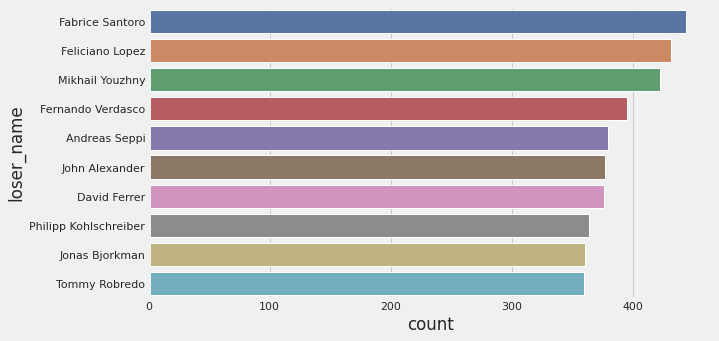

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

df_victory = df.groupby('loser_name').agg({'loser_name' : 'count'})\
                    .withColumnRenamed("count(loser_name)", "count").orderBy("count", ascending=False)
df1 = df_victory.limit(10).toPandas()
fig, ax = plt.subplots()
fig.set_size_inches(9, 5)
sns.set(style="dark", font_scale=1)
ax = sns.barplot(data=df1, y='loser_name', x='count')


## Feature Selection

Out[117]: <AxesSubplot:>

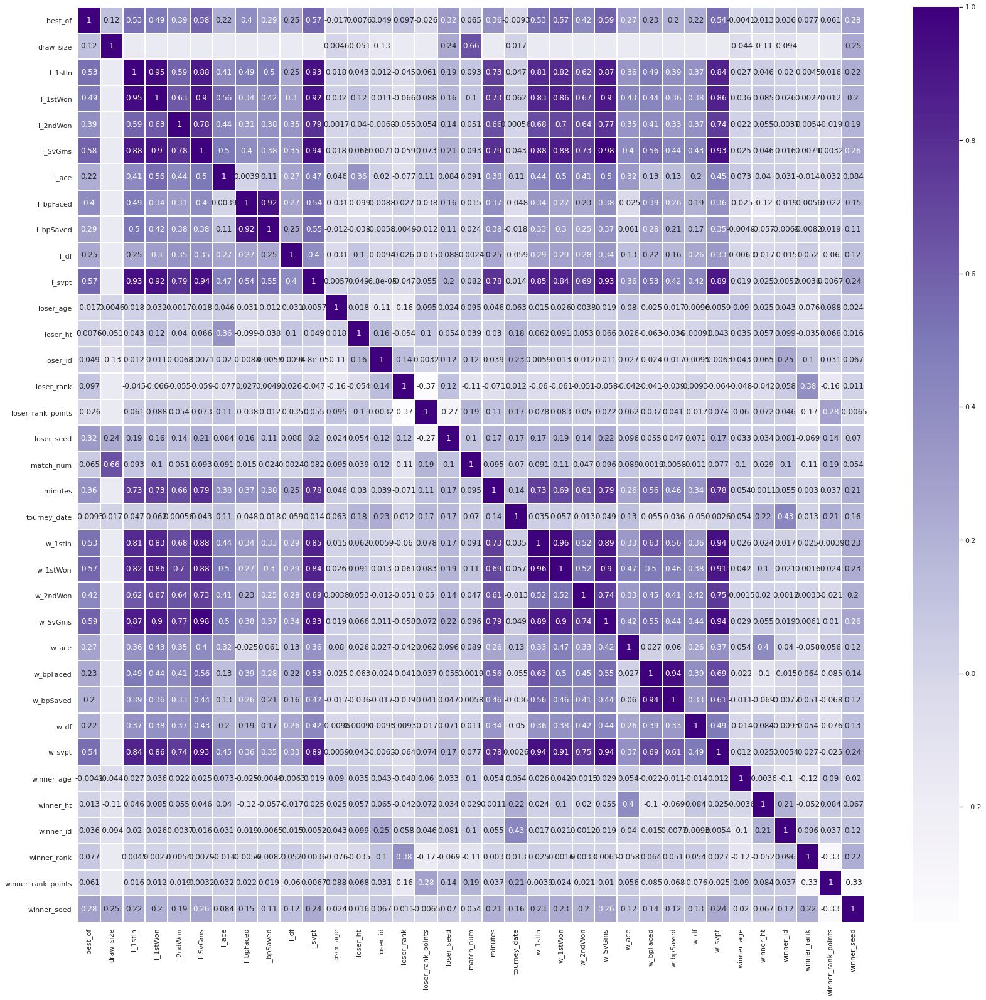

In [ ]:
df_new = df.toPandas()
corrM = df_new.corr()
plt.figure(figsize=(25,25))

sns.heatmap(corrM, annot=True, linewidth=0.2, cmap='Purples')

## Data Cleaning and Data Transformation

In [ ]:
from pyspark.sql.functions import col,isnan, when, count
df1=df.select('best_of', 'draw_size', 'loser_age', 'loser_entry', 'loser_hand',
       'loser_ht', 'loser_id', 'loser_ioc', 'loser_rank', 'loser_rank_points',
       'loser_seed', 'match_num', 'round', 'surface', 'tourney_date',
       'tourney_id', 'tourney_level', 'winner_age', 'winner_entry',
       'winner_hand', 'winner_ht', 'winner_id', 'winner_ioc', 'winner_rank',
       'winner_rank_points', 'winner_seed')
df1
display(df1)


best_of,draw_size,loser_age,loser_entry,loser_hand,loser_ht,loser_id,loser_ioc,loser_rank,loser_rank_points,loser_seed,match_num,round,surface,tourney_date,tourney_id,tourney_level,winner_age,winner_entry,winner_hand,winner_ht,winner_id,winner_ioc,winner_rank,winner_rank_points,winner_seed
5,64.0,null,null,R,null,107760,AUS,null,null,null,1,R64,Grass,19680119,1968-580,G,null,null,R,null,110023,AUS,null,null,null
5,64.0,null,null,R,null,106964,AUS,null,null,null,2,R64,Grass,19680119,1968-580,G,27.5208761123,null,R,null,109803,AUS,null,null,null
5,64.0,null,null,R,null,110024,INA,null,null,15.0,3,R64,Grass,19680119,1968-580,G,16.2162902122,null,R,null,100257,AUS,null,null,null
5,64.0,null,null,R,null,110025,AUS,null,null,null,4,R64,Grass,19680119,1968-580,G,22.264202600999997,null,R,null,100105,AUS,null,null,5.0
5,64.0,null,null,R,null,110026,AUS,null,null,null,5,R64,Grass,19680119,1968-580,G,29.8617385352,null,R,null,109966,AUS,null,null,null
5,64.0,null,null,R,null,110027,JPN,null,null,null,6,R64,Grass,19680119,1968-580,G,null,null,R,null,107759,AUS,null,null,null
5,64.0,null,null,R,null,110028,AUS,null,null,null,7,R64,Grass,19680119,1968-580,G,22.5571526352,null,R,null,100101,CAN,null,null,12.0
5,64.0,null,null,R,null,108430,AUS,null,null,null,8,R64,Grass,19680119,1968-580,G,30.5297741273,null,R,173.0,100025,AUS,null,null,3.0
5,64.0,null,null,R,null,110029,AUS,null,null,null,9,R64,Grass,19680119,1968-580,G,null,null,R,null,108519,AUS,null,null,null
5,64.0,null,null,R,null,110030,BEL,null,null,null,10,R64,Grass,19680119,1968-580,G,34.0013689254,null,R,null,109799,AUS,null,null,null


In [ ]:
df2=ten_df1.select('best_of', 'loser_age', 'loser_hand',
       'loser_ht', 'loser_id', 'loser_ioc', 'loser_rank', 'loser_rank_points', 'match_num', 'round', 'surface', 'tourney_date',
       'tourney_id', 'tourney_level', 'winner_age', 'winner_hand', 'winner_ht', 'winner_id', 'winner_ioc', 'winner_rank', 'winner_rank_points')
display(df2)
df3=df2.dropna()
display(df3)

best_of,loser_age,loser_hand,loser_ht,loser_id,loser_ioc,loser_rank,loser_rank_points,match_num,round,surface,tourney_date,tourney_id,tourney_level,winner_age,winner_hand,winner_ht,winner_id,winner_ioc,winner_rank,winner_rank_points
5,null,R,null,107760,AUS,null,null,1,R64,Grass,19680119,1968-580,G,null,R,null,110023,AUS,null,null
5,null,R,null,106964,AUS,null,null,2,R64,Grass,19680119,1968-580,G,27.5208761123,R,null,109803,AUS,null,null
5,null,R,null,110024,INA,null,null,3,R64,Grass,19680119,1968-580,G,16.2162902122,R,null,100257,AUS,null,null
5,null,R,null,110025,AUS,null,null,4,R64,Grass,19680119,1968-580,G,22.264202600999997,R,null,100105,AUS,null,null
5,null,R,null,110026,AUS,null,null,5,R64,Grass,19680119,1968-580,G,29.8617385352,R,null,109966,AUS,null,null
5,null,R,null,110027,JPN,null,null,6,R64,Grass,19680119,1968-580,G,null,R,null,107759,AUS,null,null
5,null,R,null,110028,AUS,null,null,7,R64,Grass,19680119,1968-580,G,22.5571526352,R,null,100101,CAN,null,null
5,null,R,null,108430,AUS,null,null,8,R64,Grass,19680119,1968-580,G,30.5297741273,R,173.0,100025,AUS,null,null
5,null,R,null,110029,AUS,null,null,9,R64,Grass,19680119,1968-580,G,null,R,null,108519,AUS,null,null
5,null,R,null,110030,BEL,null,null,10,R64,Grass,19680119,1968-580,G,34.0013689254,R,null,109799,AUS,null,null


best_of,loser_age,loser_hand,loser_ht,loser_id,loser_ioc,loser_rank,loser_rank_points,match_num,round,surface,tourney_date,tourney_id,tourney_level,winner_age,winner_hand,winner_ht,winner_id,winner_ioc,winner_rank,winner_rank_points
3,20.4,R,190.0,101632,SWE,282.0,70.0,1,R32,Hard,19900101,1990-339,A,18.96,R,188.0,101843,ESP,25.0,591.0
3,25.01,L,190.0,101096,RSA,127.0,182.0,2,R32,Hard,19900101,1990-339,A,29.0,L,183.0,100714,AUS,146.0,157.0
3,23.9,R,183.0,101232,SWE,71.0,290.0,3,R32,Hard,19900101,1990-339,A,21.2,R,193.0,101529,GER,113.0,215.0
3,21.94,L,190.0,101434,CZE,80.0,271.0,4,R32,Hard,19900101,1990-339,A,30.23,R,201.0,100628,NED,68.0,297.0
3,22.35,R,180.0,101387,ITA,100.0,224.0,5,R32,Hard,19900101,1990-339,A,22.25,L,180.0,101404,AUT,34.0,496.0
3,21.02,R,193.0,101552,BEL,336.0,54.0,6,R32,Hard,19900101,1990-339,A,29.01,R,183.0,100713,AUS,107.0,217.0
3,19.75,R,185.0,101727,AUS,91.0,245.0,7,R32,Hard,19900101,1990-339,A,23.63,L,178.0,101256,AUS,115.0,211.0
3,22.7,R,175.0,101344,CRO,90.0,247.0,8,R32,Hard,19900101,1990-339,A,26.79,R,185.0,100901,USA,51.0,361.0
3,24.74,R,188.0,101123,GER,164.0,135.0,9,R32,Hard,19900101,1990-339,A,21.91,R,185.0,101440,NED,63.0,306.0
3,23.87,R,188.0,101235,NED,76.0,280.0,10,R32,Hard,19900101,1990-339,A,23.89,R,190.0,101234,GER,96.0,236.0


In [ ]:
from pyspark.sql.functions import regexp_extract,col

df3 = df3.withColumn('winner_rank', df3['winner_rank'].cast('float'))
df3 = df3.withColumn('loser_rank', df3['loser_rank'].cast('float'))
df3 = df3.withColumn('winner_age', df3['winner_age'].cast('float'))
df3 = df3.withColumn('loser_age', df3['loser_age'].cast('float'))
df3 = df3.withColumn('winner_ht', df3['winner_ht'].cast('float'))
df3 = df3.withColumn('loser_ht', df3['loser_ht'].cast('float'))

In [ ]:
display(df3)

best_of,loser_age,loser_hand,loser_ht,loser_id,loser_ioc,loser_rank,loser_rank_points,match_num,round,surface,tourney_date,tourney_id,tourney_level,winner_age,winner_hand,winner_ht,winner_id,winner_ioc,winner_rank,winner_rank_points
3,20.4,R,190.0,101632,SWE,282.0,70.0,1,R32,Hard,19900101,1990-339,A,18.96,R,188.0,101843,ESP,25.0,591.0
3,25.01,L,190.0,101096,RSA,127.0,182.0,2,R32,Hard,19900101,1990-339,A,29.0,L,183.0,100714,AUS,146.0,157.0
3,23.9,R,183.0,101232,SWE,71.0,290.0,3,R32,Hard,19900101,1990-339,A,21.2,R,193.0,101529,GER,113.0,215.0
3,21.94,L,190.0,101434,CZE,80.0,271.0,4,R32,Hard,19900101,1990-339,A,30.23,R,201.0,100628,NED,68.0,297.0
3,22.35,R,180.0,101387,ITA,100.0,224.0,5,R32,Hard,19900101,1990-339,A,22.25,L,180.0,101404,AUT,34.0,496.0
3,21.02,R,193.0,101552,BEL,336.0,54.0,6,R32,Hard,19900101,1990-339,A,29.01,R,183.0,100713,AUS,107.0,217.0
3,19.75,R,185.0,101727,AUS,91.0,245.0,7,R32,Hard,19900101,1990-339,A,23.63,L,178.0,101256,AUS,115.0,211.0
3,22.7,R,175.0,101344,CRO,90.0,247.0,8,R32,Hard,19900101,1990-339,A,26.79,R,185.0,100901,USA,51.0,361.0
3,24.74,R,188.0,101123,GER,164.0,135.0,9,R32,Hard,19900101,1990-339,A,21.91,R,185.0,101440,NED,63.0,306.0
3,23.87,R,188.0,101235,NED,76.0,280.0,10,R32,Hard,19900101,1990-339,A,23.89,R,190.0,101234,GER,96.0,236.0


In [ ]:
df4 = df3.withColumn('tourney_year',df3.tourney_date.substr(1,4))
df4 = df4.withColumn('tourney_month',df4.tourney_date.substr(5,2))

df4 = df4.drop(df4.tourney_date)
display(df4)

best_of,loser_age,loser_hand,loser_ht,loser_id,loser_ioc,loser_rank,loser_rank_points,match_num,round,surface,tourney_id,tourney_level,winner_age,winner_hand,winner_ht,winner_id,winner_ioc,winner_rank,winner_rank_points,tourney_year,tourney_month
3,20.4,R,190.0,101632,SWE,282.0,70.0,1,R32,Hard,1990-339,A,18.96,R,188.0,101843,ESP,25.0,591.0,1990,01
3,25.01,L,190.0,101096,RSA,127.0,182.0,2,R32,Hard,1990-339,A,29.0,L,183.0,100714,AUS,146.0,157.0,1990,01
3,23.9,R,183.0,101232,SWE,71.0,290.0,3,R32,Hard,1990-339,A,21.2,R,193.0,101529,GER,113.0,215.0,1990,01
3,21.94,L,190.0,101434,CZE,80.0,271.0,4,R32,Hard,1990-339,A,30.23,R,201.0,100628,NED,68.0,297.0,1990,01
3,22.35,R,180.0,101387,ITA,100.0,224.0,5,R32,Hard,1990-339,A,22.25,L,180.0,101404,AUT,34.0,496.0,1990,01
3,21.02,R,193.0,101552,BEL,336.0,54.0,6,R32,Hard,1990-339,A,29.01,R,183.0,100713,AUS,107.0,217.0,1990,01
3,19.75,R,185.0,101727,AUS,91.0,245.0,7,R32,Hard,1990-339,A,23.63,L,178.0,101256,AUS,115.0,211.0,1990,01
3,22.7,R,175.0,101344,CRO,90.0,247.0,8,R32,Hard,1990-339,A,26.79,R,185.0,100901,USA,51.0,361.0,1990,01
3,24.74,R,188.0,101123,GER,164.0,135.0,9,R32,Hard,1990-339,A,21.91,R,185.0,101440,NED,63.0,306.0,1990,01
3,23.87,R,188.0,101235,NED,76.0,280.0,10,R32,Hard,1990-339,A,23.89,R,190.0,101234,GER,96.0,236.0,1990,01


## Feature engineering

In [ ]:
df5 = df4.select(col("loser_age").alias("first_age"), \

  col("loser_hand").alias("first_hand"), \
  col("loser_ht").alias("first_ht"), \
  col("loser_id").alias("first_id"), \
  col("loser_ioc").alias("first_ioc"), \
  col("loser_rank").alias("first_rank"), \
  col("loser_rank_points").alias("first_rank_points"), \
  col("winner_age").alias("second_age"), \
  col("winner_hand").alias("second_hand"), \
  col("winner_ht").alias("second_ht"), \
  col("winner_id").alias("second_id"), \
  col("winner_ioc").alias("second_ioc"), \
  col("winner_rank").alias("second_rank"), \
  col("winner_rank_points").alias("second_rank_points"))

display(df5)

first_age,first_hand,first_ht,first_id,first_ioc,first_rank,first_rank_points,second_age,second_hand,second_ht,second_id,second_ioc,second_rank,second_rank_points
20.4,R,190.0,101632,SWE,282.0,70.0,18.96,R,188.0,101843,ESP,25.0,591.0
25.01,L,190.0,101096,RSA,127.0,182.0,29.0,L,183.0,100714,AUS,146.0,157.0
23.9,R,183.0,101232,SWE,71.0,290.0,21.2,R,193.0,101529,GER,113.0,215.0
21.94,L,190.0,101434,CZE,80.0,271.0,30.23,R,201.0,100628,NED,68.0,297.0
22.35,R,180.0,101387,ITA,100.0,224.0,22.25,L,180.0,101404,AUT,34.0,496.0
21.02,R,193.0,101552,BEL,336.0,54.0,29.01,R,183.0,100713,AUS,107.0,217.0
19.75,R,185.0,101727,AUS,91.0,245.0,23.63,L,178.0,101256,AUS,115.0,211.0
22.7,R,175.0,101344,CRO,90.0,247.0,26.79,R,185.0,100901,USA,51.0,361.0
24.74,R,188.0,101123,GER,164.0,135.0,21.91,R,185.0,101440,NED,63.0,306.0
23.87,R,188.0,101235,NED,76.0,280.0,23.89,R,190.0,101234,GER,96.0,236.0


In [ ]:
df5_2 = df5.select("*")

df6 = df5_2.select(col("first_age").alias("second_age"), \
  col("first_hand").alias("second_hand"), \
  col("first_ht").alias("second_ht"), \
  col("first_id").alias("second_id"), \
  col("first_ioc").alias("second_ioc"), \
  col("first_rank").alias("second_rank"), \
  col("first_rank_points").alias("second_rank_points"), \
  col("second_age").alias("first_age"), \
  col("second_hand").alias("first_hand"), \
  col("second_ht").alias("first_ht"), \
  col("second_id").alias("first_id"), \
  col("second_ioc").alias("first_ioc"), \
  col("second_rank").alias("first_rank"), \
  col("second_rank_points").alias("first_rank_points"))

display(df6)

second_age,second_hand,second_ht,second_id,second_ioc,second_rank,second_rank_points,first_age,first_hand,first_ht,first_id,first_ioc,first_rank,first_rank_points
20.4,R,190.0,101632,SWE,282.0,70.0,18.96,R,188.0,101843,ESP,25.0,591.0
25.01,L,190.0,101096,RSA,127.0,182.0,29.0,L,183.0,100714,AUS,146.0,157.0
23.9,R,183.0,101232,SWE,71.0,290.0,21.2,R,193.0,101529,GER,113.0,215.0
21.94,L,190.0,101434,CZE,80.0,271.0,30.23,R,201.0,100628,NED,68.0,297.0
22.35,R,180.0,101387,ITA,100.0,224.0,22.25,L,180.0,101404,AUT,34.0,496.0
21.02,R,193.0,101552,BEL,336.0,54.0,29.01,R,183.0,100713,AUS,107.0,217.0
19.75,R,185.0,101727,AUS,91.0,245.0,23.63,L,178.0,101256,AUS,115.0,211.0
22.7,R,175.0,101344,CRO,90.0,247.0,26.79,R,185.0,100901,USA,51.0,361.0
24.74,R,188.0,101123,GER,164.0,135.0,21.91,R,185.0,101440,NED,63.0,306.0
23.87,R,188.0,101235,NED,76.0,280.0,23.89,R,190.0,101234,GER,96.0,236.0


Construct label feature

In [ ]:
df7=df5.toPandas()
df8=df6.toPandas()

import numpy as np
victory_player1 = np.zeros(df7.shape[0])
df7['label'] = victory_player1
victory_player2 = np.ones(df8.shape[0])
df8['label'] = victory_player2
display(df7)
len(df7)

first_age,first_hand,first_ht,first_id,first_ioc,first_rank,first_rank_points,second_age,second_hand,second_ht,second_id,second_ioc,second_rank,second_rank_points,label
20.4,R,190.0,101632,SWE,282.0,70.0,18.96,R,188.0,101843,ESP,25.0,591.0,0.0
25.01,L,190.0,101096,RSA,127.0,182.0,29.0,L,183.0,100714,AUS,146.0,157.0,0.0
23.9,R,183.0,101232,SWE,71.0,290.0,21.2,R,193.0,101529,GER,113.0,215.0,0.0
21.94,L,190.0,101434,CZE,80.0,271.0,30.23,R,201.0,100628,NED,68.0,297.0,0.0
22.35,R,180.0,101387,ITA,100.0,224.0,22.25,L,180.0,101404,AUT,34.0,496.0,0.0
21.02,R,193.0,101552,BEL,336.0,54.0,29.01,R,183.0,100713,AUS,107.0,217.0,0.0
19.75,R,185.0,101727,AUS,91.0,245.0,23.63,L,178.0,101256,AUS,115.0,211.0,0.0
22.7,R,175.0,101344,CRO,90.0,247.0,26.79,R,185.0,100901,USA,51.0,361.0,0.0
24.74,R,188.0,101123,GER,164.0,135.0,21.91,R,185.0,101440,NED,63.0,306.0,0.0
23.87,R,188.0,101235,NED,76.0,280.0,23.89,R,190.0,101234,GER,96.0,236.0,0.0


Out[125]: 83909

In [ ]:
display(df8)


second_age,second_hand,second_ht,second_id,second_ioc,second_rank,second_rank_points,first_age,first_hand,first_ht,first_id,first_ioc,first_rank,first_rank_points,label
20.4,R,190.0,101632,SWE,282.0,70.0,18.96,R,188.0,101843,ESP,25.0,591.0,1.0
25.01,L,190.0,101096,RSA,127.0,182.0,29.0,L,183.0,100714,AUS,146.0,157.0,1.0
23.9,R,183.0,101232,SWE,71.0,290.0,21.2,R,193.0,101529,GER,113.0,215.0,1.0
21.94,L,190.0,101434,CZE,80.0,271.0,30.23,R,201.0,100628,NED,68.0,297.0,1.0
22.35,R,180.0,101387,ITA,100.0,224.0,22.25,L,180.0,101404,AUT,34.0,496.0,1.0
21.02,R,193.0,101552,BEL,336.0,54.0,29.01,R,183.0,100713,AUS,107.0,217.0,1.0
19.75,R,185.0,101727,AUS,91.0,245.0,23.63,L,178.0,101256,AUS,115.0,211.0,1.0
22.7,R,175.0,101344,CRO,90.0,247.0,26.79,R,185.0,100901,USA,51.0,361.0,1.0
24.74,R,188.0,101123,GER,164.0,135.0,21.91,R,185.0,101440,NED,63.0,306.0,1.0
23.87,R,188.0,101235,NED,76.0,280.0,23.89,R,190.0,101234,GER,96.0,236.0,1.0


In [ ]:
import pandas as pd

df = pd.concat([df7,df8])
display(df)


first_age,first_hand,first_ht,first_id,first_ioc,first_rank,first_rank_points,second_age,second_hand,second_ht,second_id,second_ioc,second_rank,second_rank_points,label
20.4,R,190.0,101632,SWE,282.0,70.0,18.96,R,188.0,101843,ESP,25.0,591.0,0.0
25.01,L,190.0,101096,RSA,127.0,182.0,29.0,L,183.0,100714,AUS,146.0,157.0,0.0
23.9,R,183.0,101232,SWE,71.0,290.0,21.2,R,193.0,101529,GER,113.0,215.0,0.0
21.94,L,190.0,101434,CZE,80.0,271.0,30.23,R,201.0,100628,NED,68.0,297.0,0.0
22.35,R,180.0,101387,ITA,100.0,224.0,22.25,L,180.0,101404,AUT,34.0,496.0,0.0
21.02,R,193.0,101552,BEL,336.0,54.0,29.01,R,183.0,100713,AUS,107.0,217.0,0.0
19.75,R,185.0,101727,AUS,91.0,245.0,23.63,L,178.0,101256,AUS,115.0,211.0,0.0
22.7,R,175.0,101344,CRO,90.0,247.0,26.79,R,185.0,100901,USA,51.0,361.0,0.0
24.74,R,188.0,101123,GER,164.0,135.0,21.91,R,185.0,101440,NED,63.0,306.0,0.0
23.87,R,188.0,101235,NED,76.0,280.0,23.89,R,190.0,101234,GER,96.0,236.0,0.0


In [ ]:
#shuffle data
df = df.sample(frac=1).reset_index(drop=True)
df

,first_age,first_hand,first_ht,first_id,first_ioc,first_rank,first_rank_points,second_age,second_hand,second_ht,second_id,second_ioc,second_rank,second_rank_points,label
0,28.900000,R,180.0,101191,USA,48.0,787.0,24.340000,R,196.0,101735,AUS,49.0,773.0,1.0
1,24.340000,R,178.0,105453,JPN,12.0,2440.0,32.619999,L,188.0,103852,ESP,29.0,1225.0,1.0
2,20.379999,L,183.0,103781,AUT,195.0,194.0,22.510000,R,185.0,103356,SUI,42.0,857.0,0.0
3,25.910000,R,193.0,104417,SWE,5.0,4935.0,29.389999,L,180.0,103714,SWE,347.0,112.0,1.0
4,30.480000,R,185.0,101249,RUS,90.0,538.0,23.090000,L,193.0,102257,GBR,75.0,643.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
167813,29.209999,R,193.0,101609,USA,263.0,149.0,17.309999,R,188.0,103758,USA,574.0,34.0,1.0
167814,25.570000,L,178.0,103675,ARG,152.0,276.0,33.110001,R,190.0,102231,ESP,188.0,214.0,0.0
167815,23.950001,R,185.0,102450,GBR,10.0,2286.0,27.020000,L,183.0,101947,ITA,132.0,355.0,1.0
167816,31.379999,L,190.0,103566,FRA,33.0,1165.0,27.879999,L,188.0,104269,ESP,23.0,1515.0,0.0


In [ ]:
df = spark.createDataFrame(df)
type(df)
df.printSchema()

root
 |-- first_age: float (nullable = true)
 |-- first_hand: string (nullable = true)
 |-- first_ht: float (nullable = true)
 |-- first_id: integer (nullable = true)
 |-- first_ioc: string (nullable = true)
 |-- first_rank: float (nullable = true)
 |-- first_rank_points: double (nullable = true)
 |-- second_age: float (nullable = true)
 |-- second_hand: string (nullable = true)
 |-- second_ht: float (nullable = true)
 |-- second_id: integer (nullable = true)
 |-- second_ioc: string (nullable = true)
 |-- second_rank: float (nullable = true)
 |-- second_rank_points: double (nullable = true)
 |-- label: double (nullable = true)



Splitting the data into Train and Test

In [ ]:
train_data,test_data  = df.randomSplit([0.6, 0.4], 24)   # proportions [], seed for random

print("records in training data : " + str(train_data.count()))
print("records in testing data : " + str(test_data.count()))

records in training data : 100851
records in testing data : 66967


# Modeling & Tuning

Create a pipeline to transform using RFormula, also included Random Forest<br>
Data Modeling and Tuning using Paramgrid and CrossValidation

In [ ]:
from pyspark.ml.feature import VectorAssembler,RFormula
from pyspark.ml.feature import StringIndexer, IndexToString, VectorAssembler
from pyspark.ml.classification import GBTClassifier
from pyspark.ml.evaluation import MulticlassClassificationEvaluator
from pyspark.ml import Pipeline, Model
from pyspark.ml.classification import LinearSVC
from pyspark.ml.classification import GBTClassifier, RandomForestClassifier, LogisticRegression
from pyspark.ml.tuning import ParamGridBuilder, CrossValidator


columns = df.columns
# Not using label column in features
columns.remove('label')
columns.remove('first_hand')
columns.remove('first_ioc')
columns.remove('second_hand')
columns.remove('second_ioc')

# with RFormula (whih will create a feature column)
formula = "{} ~ {}".format("label", " + ".join(columns))
print("Formula : {}".format(formula))
rformula = RFormula(formula = formula)

pipeline = Pipeline(stages=[])

basePipeline =[rformula]

#############################################################
# Specify Random Forrest model
rf = RandomForestClassifier(labelCol ="label", featuresCol ="features")
pl_rf = basePipeline + [rf]
pg_rf = ParamGridBuilder()\
      .baseOn({pipeline.stages: pl_rf})\
      .addGrid(rf.maxDepth,[3,4])\
      .build()

#############################################################
# Specify SVM model
lsvc = LinearSVC(labelCol ="label", featuresCol ="features", maxIter=10, regParam=0.1)
pl_lsvc = basePipeline + [rf]
pg_lsvc = ParamGridBuilder()\
      .baseOn({pipeline.stages: pl_lsvc})\
      .build()

# One grid from the individual grids
paramGrid = pg_rf + pg_lsvc

Formula : label ~ first_age + first_ht + first_id + first_rank + first_rank_points + second_age + second_ht + second_id + second_rank + second_rank_points


Fitting the Model

In [ ]:
from pyspark.ml.evaluation import  MulticlassClassificationEvaluator, BinaryClassificationEvaluator

evaluator=BinaryClassificationEvaluator(rawPredictionCol="rawPrediction",labelCol="label")

cv = CrossValidator()\
      .setEstimator(pipeline)\
      .setEvaluator(evaluator)\
      .setEstimatorParamMaps(paramGrid)\
      .setNumFolds(2)

cvModel = cv.fit(train_data.limit(100))

Displaying the  **Best Model** and its parameters

In [ ]:
bestmodel = cvModel.bestModel

## Best and Worst Model

In [ ]:
import numpy as np
# RegressionEvaluator metric name is r2, so higher is better
# http://gim.unmc.edu/dxtests/roc3.htm
print("Best Model")
print(cvModel.getEstimatorParamMaps()[ np.argmax(cvModel.avgMetrics) ])
print("Worst Model")
print (cvModel.getEstimatorParamMaps()[ np.argmin(cvModel.avgMetrics) ])

Best Model
{Param(parent='Pipeline_f21332e9a47d', name='stages', doc='a list of pipeline stages'): [RFormula_d6d34d132365, RandomForestClassifier_af69647e0545], Param(parent='RandomForestClassifier_af69647e0545', name='maxDepth', doc='Maximum depth of the tree. (>= 0) E.g., depth 0 means 1 leaf node; depth 1 means 1 internal node + 2 leaf nodes. Must be in range [0, 30].'): 3}
Worst Model
{Param(parent='Pipeline_f21332e9a47d', name='stages', doc='a list of pipeline stages'): [RFormula_d6d34d132365, RandomForestClassifier_af69647e0545], Param(parent='RandomForestClassifier_af69647e0545', name='maxDepth', doc='Maximum depth of the tree. (>= 0) E.g., depth 0 means 1 leaf node; depth 1 means 1 internal node + 2 leaf nodes. Must be in range [0, 30].'): 4}


#### Model Measures

In [ ]:
import re
def paramGrid_model_name(model):
  params = [v for v in model.values() if type(v) is not list]
  name = [v[-1] for v in model.values() if type(v) is list][0]
  name = re.match(r'([a-zA-Z]*)', str(name)).groups()[0]
  return "{}{}".format(name,params)

measures = zip(cvModel.avgMetrics, [paramGrid_model_name(m) for m in paramGrid])
metrics,model_names = zip(*measures)

## Prediction and Evaluation

Prediction using test data

In [ ]:
predictions = bestmodel.transform(test_data)
display(predictions)
predictions.select("prediction", "label").show(5)

first_age,first_hand,first_ht,first_id,first_ioc,first_rank,first_rank_points,second_age,second_hand,second_ht,second_id,second_ioc,second_rank,second_rank_points,label,features,rawPrediction,probability,prediction
16.86,L,185.0,104745,ESP,109.0,337.0,21.25,R,175.0,103909,ARG,26.0,1165.0,0.0,"Map(vectorType -> dense, length -> 10, values -> List(16.860000610351562, 185.0, 104745.0, 109.0, 337.0, 21.25, 175.0, 103909.0, 26.0, 1165.0))","Map(vectorType -> dense, length -> 2, values -> List(11.232116658385632, 8.767883341614366))","Map(vectorType -> dense, length -> 2, values -> List(0.5616058329192816, 0.4383941670807183))",0.0
16.94,R,185.0,104755,FRA,130.0,303.0,26.78,R,188.0,102839,ECU,58.0,675.0,0.0,"Map(vectorType -> dense, length -> 10, values -> List(16.940000534057617, 185.0, 104755.0, 130.0, 303.0, 26.780000686645508, 188.0, 102839.0, 58.0, 675.0))","Map(vectorType -> dense, length -> 2, values -> List(10.710505140470923, 9.289494859529077))","Map(vectorType -> dense, length -> 2, values -> List(0.5355252570235461, 0.46447474297645386))",0.0
17.11,L,185.0,104745,ESP,56.0,667.0,19.3,R,185.0,104332,GER,317.0,90.0,1.0,"Map(vectorType -> dense, length -> 10, values -> List(17.110000610351562, 185.0, 104745.0, 56.0, 667.0, 19.299999237060547, 185.0, 104332.0, 317.0, 90.0))","Map(vectorType -> dense, length -> 2, values -> List(3.9250962466326236, 16.07490375336738))","Map(vectorType -> dense, length -> 2, values -> List(0.19625481233163114, 0.8037451876683689))",1.0
17.13,L,185.0,104745,ESP,58.0,664.0,26.9,R,190.0,102845,ESP,4.0,2995.0,0.0,"Map(vectorType -> dense, length -> 10, values -> List(17.1299991607666, 185.0, 104745.0, 58.0, 664.0, 26.899999618530273, 190.0, 102845.0, 4.0, 2995.0))","Map(vectorType -> dense, length -> 2, values -> List(14.352444941213914, 5.647555058786084))","Map(vectorType -> dense, length -> 2, values -> List(0.7176222470606957, 0.2823777529393042))",0.0
17.16,L,180.0,105559,FRA,838.0,14.0,27.45,R,183.0,103506,ARG,85.0,479.0,0.0,"Map(vectorType -> dense, length -> 10, values -> List(17.15999984741211, 180.0, 105559.0, 838.0, 14.0, 27.450000762939453, 183.0, 103506.0, 85.0, 479.0))","Map(vectorType -> dense, length -> 2, values -> List(13.50791453999757, 6.492085460002429))","Map(vectorType -> dense, length -> 2, values -> List(0.6753957269998785, 0.32460427300012146))",0.0
17.19,R,196.0,102882,AUS,439.0,53.0,22.64,R,188.0,101917,RSA,69.0,604.0,0.0,"Map(vectorType -> dense, length -> 10, values -> List(17.190000534057617, 196.0, 102882.0, 439.0, 53.0, 22.639999389648438, 188.0, 101917.0, 69.0, 604.0))","Map(vectorType -> dense, length -> 2, values -> List(11.955965066655395, 8.044034933344603))","Map(vectorType -> dense, length -> 2, values -> List(0.5977982533327697, 0.4022017466672302))",0.0
17.24,R,193.0,106071,AUS,289.0,150.0,21.31,R,198.0,105227,CRO,14.0,2430.0,0.0,"Map(vectorType -> dense, length -> 10, values -> List(17.239999771118164, 193.0, 106071.0, 289.0, 150.0, 21.309999465942383, 198.0, 105227.0, 14.0, 2430.0))","Map(vectorType -> dense, length -> 2, values -> List(10.142730833442906, 9.857269166557092))","Map(vectorType -> dense, length -> 2, values -> List(0.5071365416721453, 0.4928634583278546))",0.0
17.27,R,198.0,100644,GER,159.0,343.0,21.94,R,170.0,106043,ARG,100.0,569.0,0.0,"Map(vectorType -> dense, length -> 10, values -> List(17.270000457763672, 198.0, 100644.0, 159.0, 343.0, 21.940000534057617, 170.0, 106043.0, 100.0, 569.0))","Map(vectorType -> dense, length -> 2, values -> List(11.458144054192438, 8.541855945807558))","Map(vectorType -> dense, length -> 2, values -> List(0.572907202709622, 0.427092797290378))",0.0
17.31,R,188.0,103758,USA,574.0,34.0,29.21,R,193.0,101609,USA,263.0,149.0,0.0,"Map(vectorType -> dense, length -> 10, values -> List(17.309999465942383, 188.0, 103758.0, 574.0, 34.0, 29.209999084472656, 193.0, 101609.0, 263.0, 149.0))","Map(vectorType -> dense, length -> 2, values -> List(9.812028805165944, 10.187971194834056))","Map(vectorType -> dense, length ->

+----------+-----+
|prediction|label|
+----------+-----+
|       0.0|  0.0|
|       0.0|  0.0|
|       1.0|  1.0|
|       0.0|  0.0|
|       0.0|  0.0|
+----------+-----+
only showing top 5 rows



In [ ]:
from pyspark.ml.evaluation import BinaryClassificationEvaluator
evaluator=BinaryClassificationEvaluator(rawPredictionCol="rawPrediction",labelCol="label")
predictions.select("label","rawPrediction","prediction","probability").show(5)

+-----+--------------------+----------+--------------------+
|label|       rawPrediction|prediction|         probability|
+-----+--------------------+----------+--------------------+
|  0.0|[11.2321166583856...|       0.0|[0.56160583291928...|
|  0.0|[10.7105051404709...|       0.0|[0.53552525702354...|
|  1.0|[3.92509624663262...|       1.0|[0.19625481233163...|
|  0.0|[14.3524449412139...|       0.0|[0.71762224706069...|
|  0.0|[13.5079145399975...|       0.0|[0.67539572699987...|
+-----+--------------------+----------+--------------------+
only showing top 5 rows



#### Confusion matrix

In [ ]:
from pyspark.mllib.evaluation import MulticlassMetrics
preds_and_labels = predictions.select(['prediction','label'])
metrics = MulticlassMetrics(preds_and_labels.rdd.map(tuple))
print(metrics.confusionMatrix().toArray())

/databricks/spark/python/pyspark/sql/context.py:134: FutureWarning: Deprecated in 3.0.0. Use SparkSession.builder.getOrCreate() instead.
  warnings.warn(
[[25085.  8234.]
 [21604. 12044.]]


#### Plot confusion matrix

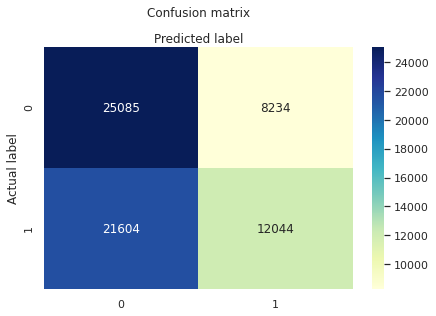

In [ ]:
cnf_matrix = pd.DataFrame(metrics.confusionMatrix().toArray())

class_names=[0,1] # name  of classes
fig, ax = plt.subplots()
tick_marks = np.arange(len(class_names))
plt.xticks(tick_marks, class_names)
plt.yticks(tick_marks, class_names)

sns.heatmap(pd.DataFrame(cnf_matrix), annot=True, cmap="YlGnBu" ,fmt='g')
ax.xaxis.set_label_position("top")

plt.tight_layout()
plt.title('Confusion matrix', y=1.1)
plt.ylabel('Actual label')
plt.xlabel('Predicted label')

display(plt.show())

#### Evaluate the best model with ROC

In [ ]:
from pyspark.mllib.evaluation import BinaryClassificationMetrics

predictionAndLabels = predictions.select('prediction','label').rdd

bin_metrics = BinaryClassificationMetrics(predictionAndLabels)

print("Area under PR = %s" % bin_metrics.areaUnderPR)
print("Area under ROC = %s" % bin_metrics.areaUnderROC)

Area under PR = 0.5645739134982632
Area under ROC = 0.5554073861603571


In [ ]:
from pyspark.mllib.evaluation import BinaryClassificationMetrics

class CurveMetrics(BinaryClassificationMetrics):
    def __init__(self, *args):
        super(CurveMetrics, self).__init__(*args)

    def _to_list(self, rdd):
        points = []
        for row in rdd.collect():
            points += [(float(row._1()), float(row._2()))]
        return points

    def get_curve(self, method):
        rdd = getattr(self._java_model, method)().toJavaRDD()
        return self._to_list(rdd)

#### Plot ROC curve

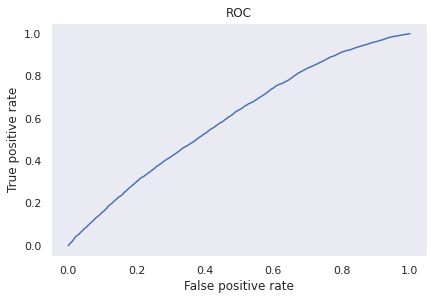

In [ ]:
import matplotlib.pyplot as plt

preds = predictions.select('label','probability').rdd.map(lambda row: (float(row['probability'][1]), float(row['label'])))
points = CurveMetrics(preds).get_curve('roc')

plt.figure()
x_val = [x[0] for x in points]
y_val = [x[1] for x in points]
plt.title("ROC")
plt.xlabel("False positive rate")
plt.ylabel("True positive rate")
plt.plot(x_val, y_val)
display(plt.show())

As of now, we have applied 2 models along with different paramter grid values, evaluated the models with ROC and SVM model is the better model for predicting the winning player in a tennis match.